# Super-Resolution Inpection

In this notebook we will inspect the superresolved images to see if our implementation of DSen2 for GeoTIFF works.
- Orginal repository: https://github.com/lanha/DSen2
- PyTorch implementation (pretrained weights): https://github.com/simonreise/remote-sensing-processor

In [1]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np

## 12 bands from train_images and 12 bands from superresolved_images
- This is we can get an overall view of all the bands.

Band and band resolution.
- 10m: B2, B3, B4
- 20m: B5, B6, B7, B8, B8A, B11, B12
- 60m: B1, B9

In [2]:
# Correct Sentinel-2 band names for 12 bands
s2_band_names = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B11', 'B12']

### 12 Bands train_images
- Below are the 12 bands from the orginal solafune dataset
- With visual inspection can we see that the bands b1 and b9 are very blurry
- The bands in 20m GSD are also blurry
- Notice the white spots, these were added by Solafune team as these are covered up cloud coverage U(NaN values)

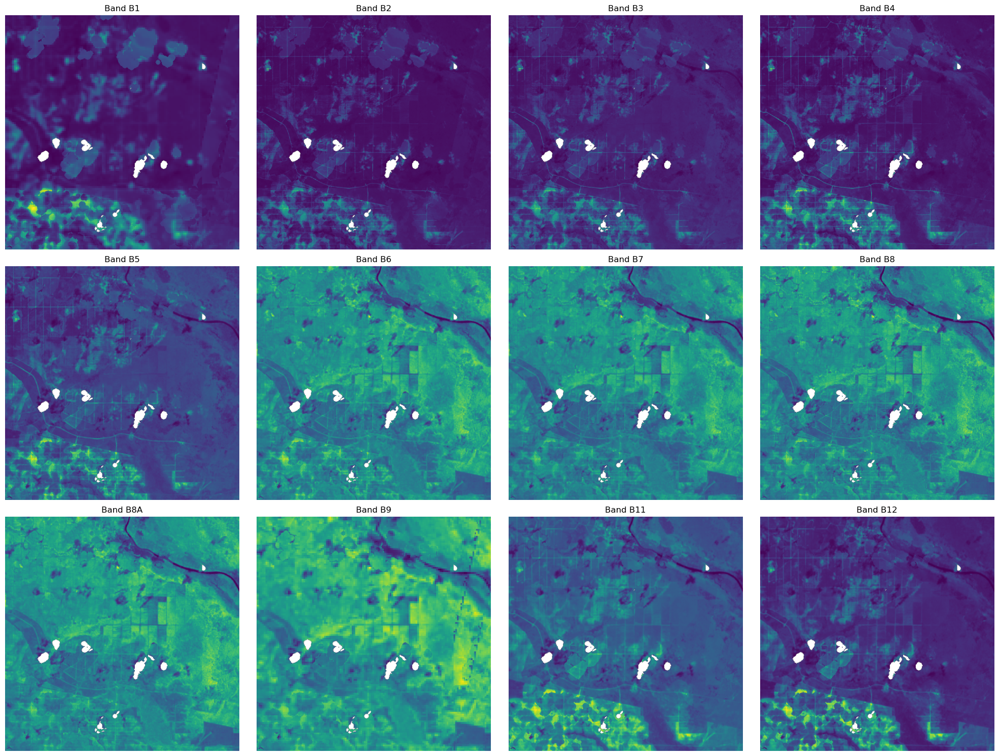

In [3]:
with rasterio.open("./../data/train_images/train_0.tif") as src:
    fig, axs = plt.subplots(3, 4, figsize=(20, 15))
    axs = axs.ravel()
    
    for i in range(1, 13):  # 12 bands
        band = src.read(i)
        axs[i - 1].imshow(band)
        axs[i - 1].set_title(f'Band {s2_band_names[i - 1]}')
        axs[i - 1].axis('off')
    
    plt.tight_layout()
    plt.show()

### 12 Bands from superresolved_images
- Below are the 12 bands from the an image that has been passed thru superresolution.py which takes use of pretrained model weights after a lot of work
- We can quickly see that the 60m GSD bands b1 and b9 are much sharper in image quality compared to the orginal images
- This is also visable for the 20m GSD ones, but less so due to the stark disparity in fidelty compared to the 60m GSD ones
- Some other things we can notice is the black spots which is due to how I handle NaN values in the superresolution.py, we can see that the superresolution algorithm maybe due to my own decisions have covered over more area compared to the orginal ones
- We can also see that the color constrasts between dark and bright areas has been subdued (especially noticable in band b9), this might worsen information each band conveys

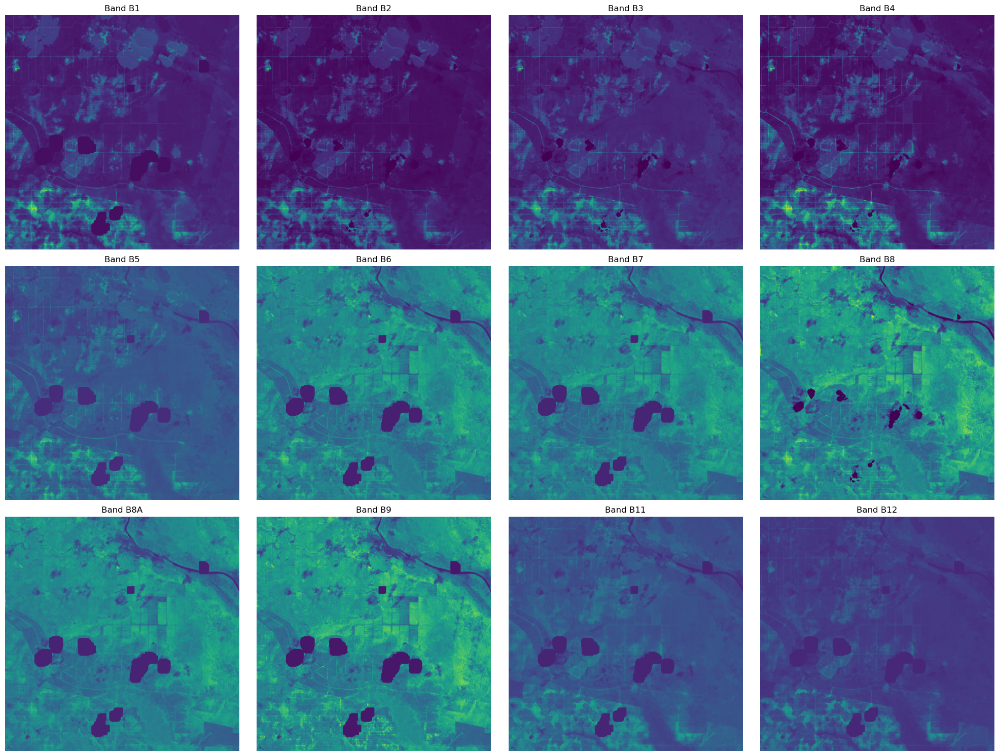

In [4]:
with rasterio.open("./../data/superresolved_images/train_0.tif") as src:
    fig, axs = plt.subplots(3, 4, figsize=(20, 15))
    axs = axs.ravel()
    
    for i in range(1, 13):  # 12 bands
        band = src.read(i)
        axs[i - 1].imshow(band)
        axs[i - 1].set_title(f'Band {s2_band_names[i - 1]}')
        axs[i - 1].axis('off')
    
    plt.tight_layout()
    plt.show()

## Looking at fewer bands
- The leftmost is the 10m rgb bands
- Middel is the orginal band in true GSD
- Rightmost superresolved of the middle

- We are doing this we can easier see the affect compared to watching all 12 bands, which is useful for getting a good overview

### 2x Superresolution
- Looking at these, I would say that 20m GSD is still relatively sharp compared to 10m GSD
- But the 10m superresolved one is sharper, manages to capture more detaiol without halucinating
- But we can also see the fact that color are more subdued

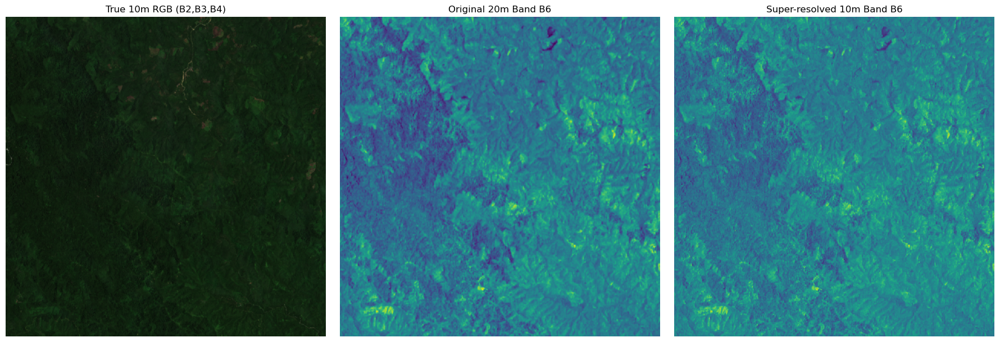

In [9]:
# Open original 10m and 20m image
with rasterio.open("./../data/train_images/train_2.tif") as src:
    red = src.read(4)   # B4
    green = src.read(3) # B3
    blue = src.read(2)  # B2
    band6_20m = src.read(6)  # B6

# Open superresolved image
with rasterio.open("./../data/superresolved_images/train_2.tif") as src_sr:
    band6_sr = src_sr.read(6)  # B6 superresolved

# Stack and normalize 10m RGB
rgb = np.stack((red, green, blue), axis=-1)
rgb_norm = np.clip(rgb / 3000.0, 0, 1)

# Plot
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Left: 10m true RGB
axs[0].imshow(rgb_norm)
axs[0].set_title('True 10m RGB (B2,B3,B4)')
axs[0].axis('off')

# Middle: Original 20m B6
axs[1].imshow(band6_20m)
axs[1].set_title('Original 20m Band B6')
axs[1].axis('off')

# Right: Super-resolved B6
axs[2].imshow(band6_sr)
axs[2].set_title('Super-resolved 10m Band B6')
axs[2].axis('off')

plt.tight_layout()
plt.show()

### x6 Superresolution'
- At this 60m GSD we can cleary see the affect of the superresolution
- The quality of the superresolution is very good and is quite true to the orginal ones when looking at landscape
- But we can clearly see the colors being more subdued


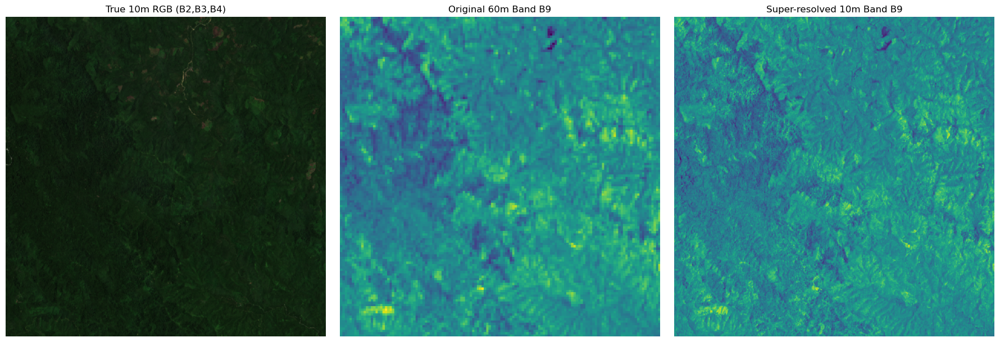

In [10]:
# Open original image
with rasterio.open("./../data/train_images/train_2.tif") as src:
    red = src.read(4)   # B4
    green = src.read(3) # B3
    blue = src.read(2)  # B2
    band9_60m = src.read(10)  # B9 (60m resolution) (loading 10 due to band naming in tif stack)

# Open superresolved image
with rasterio.open("./../data/superresolved_images/train_2.tif") as src_sr:
    band9_sr = src_sr.read(10)  # B9 superresolved (loading 10 due to band naming in tif stack)

# Stack and normalize 10m RGB
rgb = np.stack((red, green, blue), axis=-1)
rgb_norm = np.clip(rgb / 3000.0, 0, 1)

# Plot
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Left: 10m true RGB
axs[0].imshow(rgb_norm)
axs[0].set_title('True 10m RGB (B2,B3,B4)')
axs[0].axis('off')

# Middle: Original 60m B9
axs[1].imshow(band9_60m)
axs[1].set_title('Original 60m Band B9')
axs[1].axis('off')

# Right: Super-resolved B9
axs[2].imshow(band9_sr)
axs[2].set_title('Super-resolved 10m Band B9')
axs[2].axis('off')

plt.tight_layout()
plt.show()